## Task 1: Same-Modality Similarity Search

The **first task** we define for our **Game Recommendation Assistant** is the following:

**Text-based retrieval**: Given a game's description, the system finds and returns game descriptions with similar themes, genres, or content.

**Image-based retrieval**: Given a game's cover or snapshot, the system identifies visually similar game images from the database.

**Video-based retrieval**: Given a game trailer, the system retrieves trailers that share comparable visual style, mood, or gameplay elements.

In [4]:
# Importing useful dependencies
import io
import boto3
import torch
import chromadb
import open_clip
import numpy as np
from PIL import Image
from io import BytesIO
import ipywidgets as widgets
from IPython.display import display

In [5]:
# Setup S3 client for MinIO (MinIO implements Amazon S3 API)
s3 = boto3.client(
    "s3",
    endpoint_url="http://127.0.0.1:9000", # MinIO API endpoint
    aws_access_key_id="minioadmin", # User name
    aws_secret_access_key="minioadmin", # Password
)

In [6]:
# Connect to the server of ChromaDB where we stored the embeddings of files (Docker Container)
client = chromadb.HttpClient(host="localhost", port=8000)

# Create or get the collection named "texts"

# Create or get the collection named "images"
collection_images = client.create_collection(name="images", get_or_create=True, embedding_function=None)

# Create or get the collection named "videos"

In [7]:
# Just in case our device has gpu
device = "cuda" if torch.cuda.is_available() else "cpu"

Next, we implement a function that given a **file's embeddings** and a **ChromaDB collection** of embeddings returns the **k** most similar files of the same modality to the given one.

In [8]:
def find_similar_files(collection, query_emb: np.ndarray, top_k: int = 5):
    
    # Chroma expects list-of-lists for query_embeddings
    query_vector = query_emb.tolist()

    results = collection.query(
        query_embeddings=[query_vector],
        n_results=top_k,
        include=["documents", "distances"]
    )

    # Extract first query results
    ids = results.get("ids", [[]])[0]
    docs = results.get("documents", [[]])[0]
    dists = results.get("distances", [[]])[0]

    print(f"Top {top_k} similar {collection.name}:")
    for rank, (doc_id, doc, dist) in enumerate(zip(ids, docs, dists), start=1):
        print(f"{rank}. id={doc_id}, distance={dist:.4f}")
        print(f"   document: {doc}")
        temp_path = doc.split("/")[-1]
        if (collection.name == "images"):
            display(get_image("trusted-zone", f"{collection.name}/{temp_path}"))
        elif True:
            # Add cases for texts and videos
            break
    return results

**Text-based retrieval**

**Image-based retrieval**

In [9]:
# Load model + preprocessing used when creating the image embeddings
model_image, _, preprocess_image = open_clip.create_model_and_transforms("ViT-B-16", pretrained="openai")
model_image.to(device)

C:\Users\SakuraSnow\AppData\Local\Programs\Python\Python311\Lib\site-packages\open_clip\factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(


CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16), bias=False)
    (patch_dropout): Identity()
    (ln_pre): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): ModuleList(
        (0-11): 12 x ResidualAttentionBlock(
          (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (ls_1): Identity()
          (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=768, out_features=3072, bias=True)
            (gelu): GELU(approximate='none')
            (c_proj): Linear(in_features=3072, out_features=768, bias=True)
          )
          (ls_2): Identity()
        )
      )
    )
    (ln_post): LayerNorm((768,), eps=1e-05, elementwise_affine

We can either select an image from the MinIO database or upload one from local storage to perform the image similarity search.

In [10]:
# We can use this function to retrieve an image from our bucket in PIL Image format
def get_image(bucket, key):
    resp = s3.get_object(Bucket=bucket, Key=key)
    body = resp["Body"].read()
    img = Image.open(io.BytesIO(body))
    return img

In [11]:
# The next function returns the embedding of the given PIL Image
def embed_image(preprocess, model, pil_img):
    img_tensor = preprocess(pil_img).unsqueeze(0).to(device)
    with torch.no_grad():
        feats = model.encode_image(img_tensor)
    feats = feats / feats.norm(dim=-1, keepdim=True)
    return feats.cpu().numpy().squeeze()

Firstly, we can try using an image from our MinIO database.

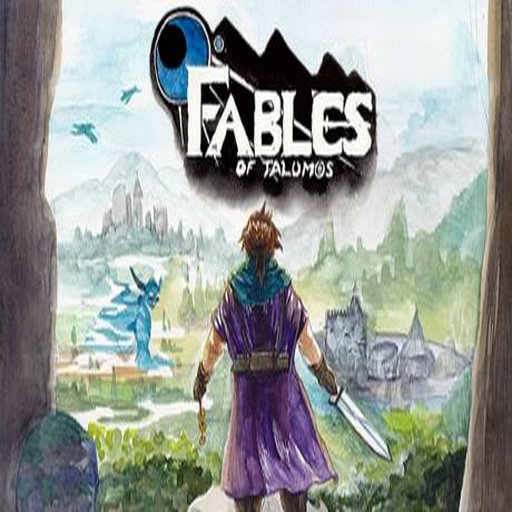

In [12]:
# Sample PIL Image
img_example_1 = get_image("trusted-zone", "images/image_1759415216572.png")
# Create embeddings for the Image
img_example_emb_1 = embed_image(preprocess_image, model_image, img_example_1)
img_example_1

Top 5 similar images:
1. id=img_115, distance=0.0000
   document: trusted-zone/images/image_1759415216572.png


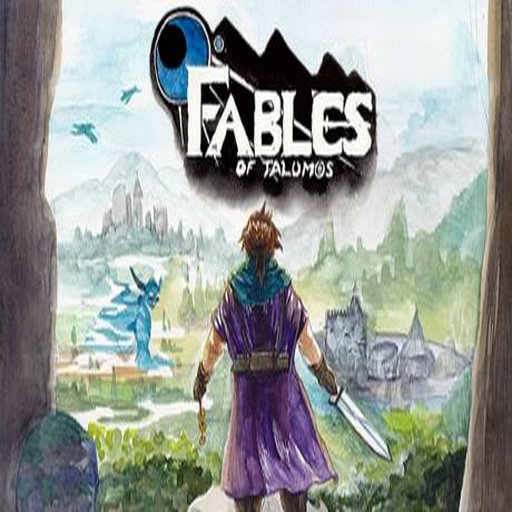

2. id=img_255, distance=0.6219
   document: trusted-zone/images/image_1759415238943.png


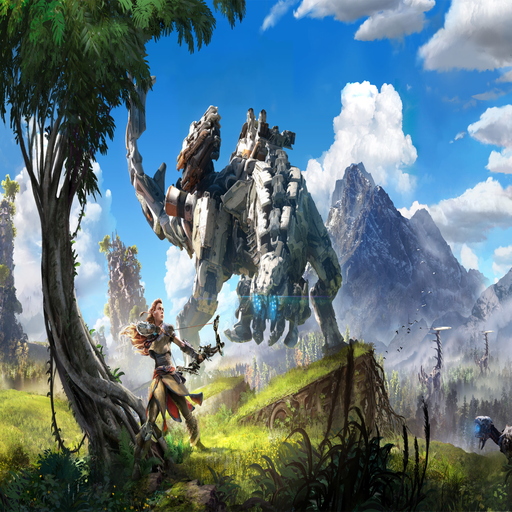

3. id=img_339, distance=0.6329
   document: trusted-zone/images/image_1759415253134.png


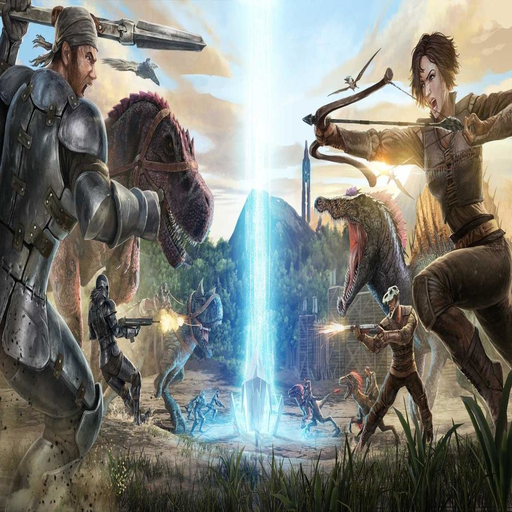

4. id=img_505, distance=0.6331
   document: trusted-zone/images/image_1759415282627.png


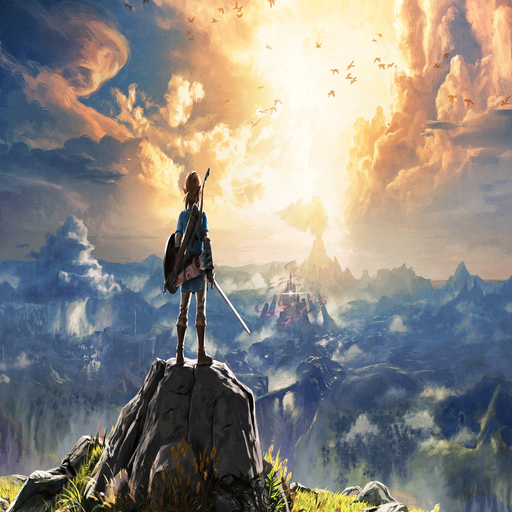

5. id=img_250, distance=0.6335
   document: trusted-zone/images/image_1759415238319.png


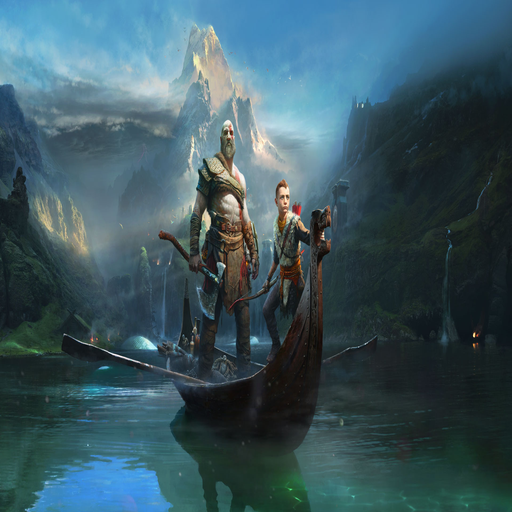

In [13]:
# Search for similar images in ChromaDB
results_1 = find_similar_files(collection_images, img_example_emb_1, top_k=5)
# The first one is always the target image itself (because it exists in our ChromaDB)

Next, we can try using an image that has never appeared before in ChromaDB.

In [17]:
# Upload an image from local storage
uploader = widgets.FileUpload(accept='image/*', multiple=False)
display(uploader)

FileUpload(value=(), accept='image/*', description='Upload')

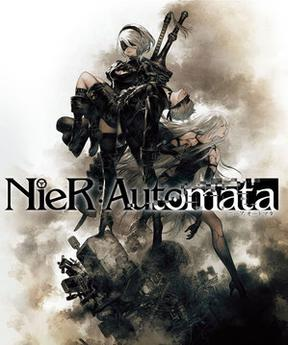

In [18]:
# Extract the uploaded file
image_data = uploader.value[0].content
img_example_2 = Image.open(BytesIO(image_data))

# Create embeddings for the Image
img_example_emb_2 = embed_image(preprocess_image, model_image, img_example_2)
img_example_2

Top 5 similar images:
1. id=img_551, distance=0.5525
   document: trusted-zone/images/image_1759415290933.png


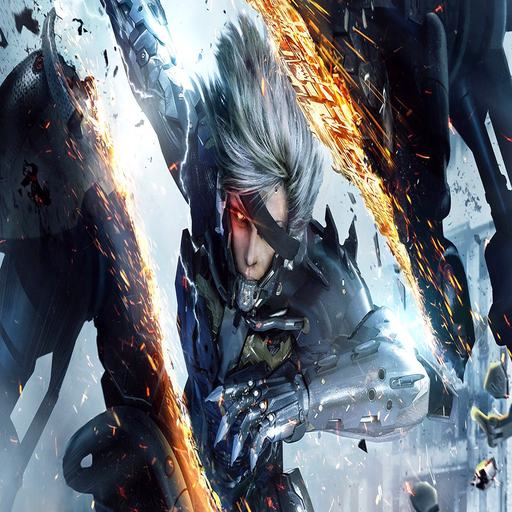

2. id=img_287, distance=0.6029
   document: trusted-zone/images/image_1759415244268.png


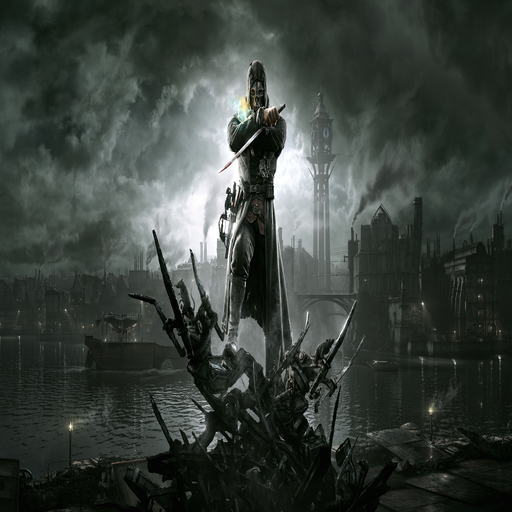

3. id=img_344, distance=0.6063
   document: trusted-zone/images/image_1759415254002.png


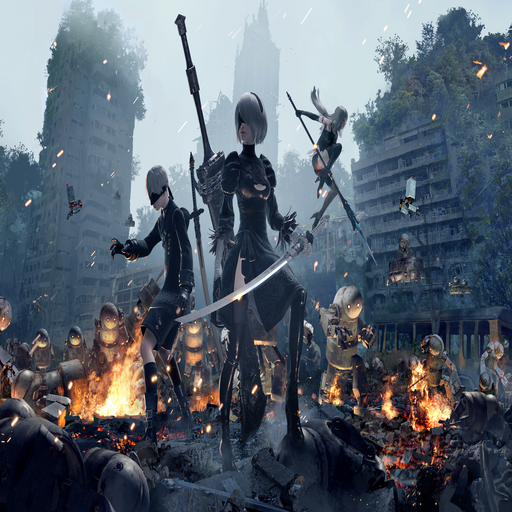

4. id=img_253, distance=0.6321
   document: trusted-zone/images/image_1759415238680.png


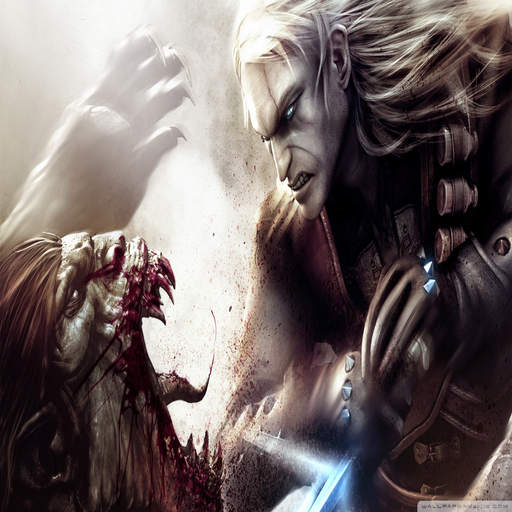

5. id=img_376, distance=0.6349
   document: trusted-zone/images/image_1759415259866.png


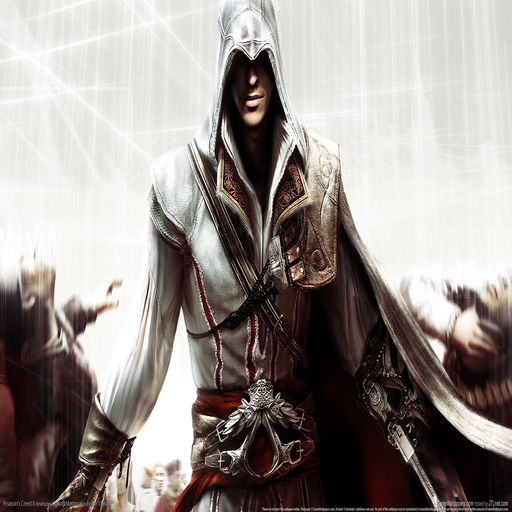

In [19]:
# Search for similar images in ChromaDB
results_2 = find_similar_files(collection_images, img_example_emb_2, top_k=5)

**Video-based retrieval**